In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import scipy
from xmca.xarray import xMCA

plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'retina'
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD

In [2]:
def basemap_base(name_projection,axes,lat,lon,lon0,fill_type):
    m = Basemap(projection=name_projection,lon_0=0,boundinglat=lon0,resolution='l',ax=axes,round=True)

    lon2, lat2 = np.meshgrid(lon,lat)
    x, y = m(lon2,lat2)

    
    if(fill_type == 'FILL'): m.fillcontinents(color='grey',lake_color='gray')
        
    m.drawcoastlines(linewidth=0.5)
    m.drawmapboundary(fill_color='white')
    
    return m, x, y;

In [3]:
def mon_to_ann_DJF(ds):
    
    ds_DJF_all = ds.where(ds['time.season'] == 'DJF')
    
    # Rolling mean -> only Jan is not nan
    # However, we loose Jan/ Feb in the first year and Dec in the last
    ds_DJF = ds_DJF_all.rolling(min_periods=3, center=True, time=3).mean()
    
    # Exceptional Case for first year
    ds_DJF[0] = ds_DJF_all[0:2].mean()

    # make annual mean
    ds_DJF = ds_DJF.groupby('time.year').mean('time')
    
    return ds_DJF

## 1. Read the Geopotential Height data (NCEP Reanalysis)

In [4]:
dir_name  = "./DATA/"
file_name = "sst_anom.mon.mean.nc"
path_name = dir_name+file_name

f         = xr.open_dataset(path_name)
sst       = f.sst  ## Sea Surface Temperature [C]
time      = f.time
lat_OCN   = f.lat  ## Latitude  [^o]
lon_OCN   = f.lon  ## Longitude [^o]

In [5]:
dir_name  = "./DATA/"
file_name = "hgt_anom.mon.mean.nc"
path_name = dir_name+file_name

f         = xr.open_dataset(path_name)
hgt       = f.hgt  ## Geopotential Height [m]
time      = f.time
lat_ATM   = f.lat  ## Latitude  [^o]
lon_ATM   = f.lon  ## Longitude [^o]

### 1-1) Slice the latitude / logitude / time

In [6]:
latS = 30.     ; latN = 90.
lonL = 0.     ; lonR = 360.

year_str = 1982 ; year_end = 2020

In [7]:
season = ["DJF"]

## Find the time index for speicified year
ind_year = np.where((time.dt.year>=year_str) & 
                    (time.dt.year<=year_end) )[0]

sst_slice     = sst.sel(lat=slice(latN,latS),lon=slice(lonL,lonR))[ind_year,:,:]

## Slice the Geopotential Height array for specified time, latitude and longitude
Z_pos         = 1000 # [hPa]
hgt_slice     = hgt.sel(lat=slice(latN,latS),lon=slice(lonL,lonR),level=Z_pos)[ind_year,:,:]

## Convert monthly data to "DJF" mean annual data
sst_slice_DJF = mon_to_ann_DJF(sst_slice)
hgt_slice_DJF = mon_to_ann_DJF(hgt_slice)

Nt_DJF, Ny_OCN, Nx_OCN = sst_slice_DJF.shape
Nt_DJF, Ny_ATM, Nx_ATM = hgt_slice_DJF.shape

In [8]:
tmp_sst = sst_slice_DJF.rename({"year":"time"})
tmp_hgt = hgt_slice_DJF.rename({"year":"time"})

### 1-2) Make the Geopotential array to 2D matrix

In [14]:
## Convert the array to 2D matrix
tmp_sst_2D_DJF   = sst_slice_DJF.values.reshape(Nt_DJF,-1)
tmp_hgt_2D_DJF   = hgt_slice_DJF.values.reshape(Nt_DJF,-1)

sst_2D_DJF = sst_slice_DJF.rename({"year":"time"})
hgt_2D_DJF = hgt_slice_DJF.rename({"year":"time"})

In [ ]:
xMCA(x)

## 2. Conduct the SVD Decomposition
### (Singular Value Decomposition)

In [48]:
mca = xMCA(sst_2D_DJF,hgt_2D_DJF)       # MCA of field A and B
mca.solve()                             # True for complex MCA
eigenvalues = mca.singular_values()     # singular vales
pcs         = mca.pcs()                 # expansion coefficient (PCs)
eofs        = mca.eofs()                # spatial patterns (EOFs)
VAR_pc      = mca.explained_variance()  # variance of SVD modes

## 3. Plot SVD Statistics

### 3-1) Plot the Variance Ratio fo each PC

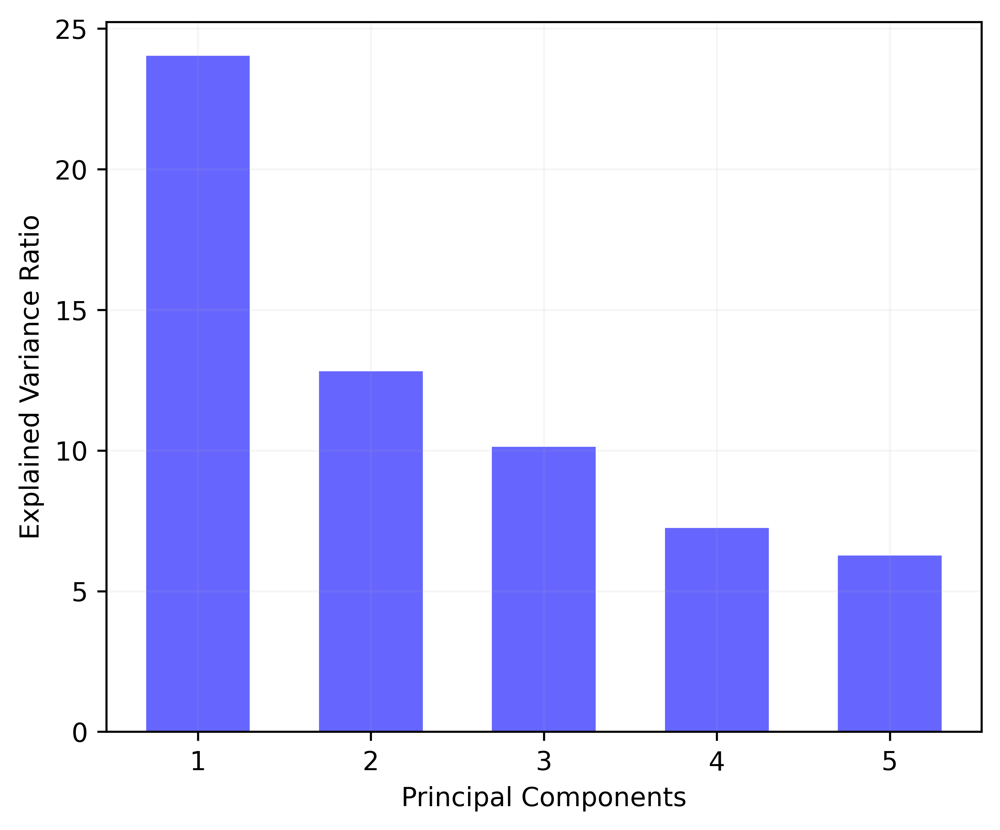

In [99]:
figs,axes = plt.subplots(1,1,figsize=(6,5))
axes.bar(np.linspace(1,5,5),VAR_pc[0:5],
                     color='b',width=0.6,alpha=0.6)
axes.set_xlabel("Principal Components")
axes.set_ylabel("Explained Variance Ratio")
axes.grid(alpha=0.1)

### 3-2) Plot the PC Time Series

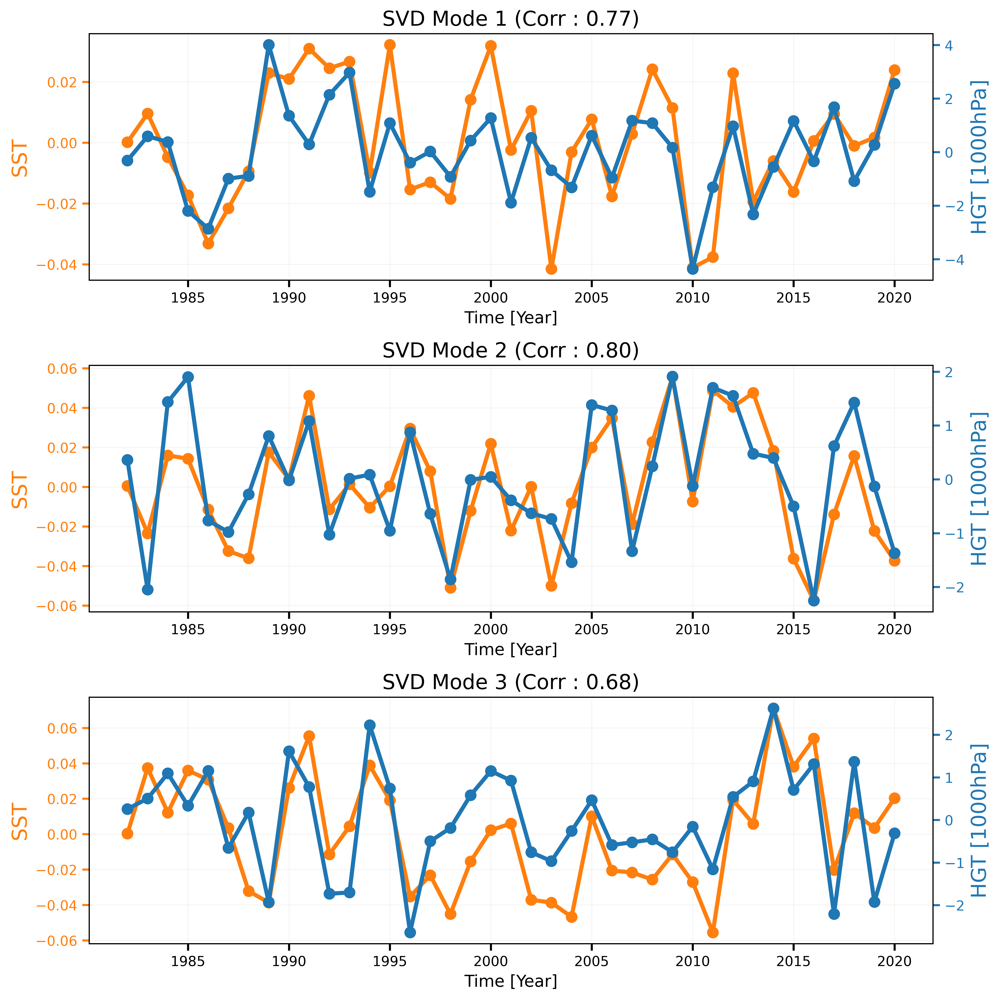

In [117]:
fig, axes = plt.subplots(3,1,figsize=(10,10),constrained_layout=True)

for ind_PC in range(3):
    tmp_corr = np.corrcoef(pcs['left'][:,ind_PC],pcs['right'][:,ind_PC])[0][1]
    ax2 = axes[ind_PC].twinx()
    label_1 = 'SST'
    label_2 = 'HGT ['+str(Z_pos)+'hPa]'
    
    line_1, = axes[ind_PC].plot(pcs['left'].time,pcs['left'][:,ind_PC],'.-',label=label_1,
                      color='tab:orange',linewidth=3,markersize=15)
    line_2, = ax2.plot(pcs['right'].time,pcs['right'][:,ind_PC],'.-',label=label_2,
                      color='tab:blue',linewidth=3,markersize=15)
    
    axes[ind_PC].set_title("SVD Mode {} (Corr : {:4.2f})".format(ind_PC+1,tmp_corr),fontsize=15)
    axes[ind_PC].set_xlabel("Time [Year]",fontsize=12)
    axes[ind_PC].set_ylabel(label_1,fontsize=15)
    ax2.set_ylabel(label_2,fontsize=15)
    axes[ind_PC].grid(alpha=0.1)
    
    tkw = dict(size=5, width=1.5)
    axes[ind_PC].tick_params(axis='y', colors=line_1.get_color(), **tkw)
    axes[ind_PC].tick_params(axis='x', **tkw)
    axes[ind_PC].yaxis.label.set_color(line_1.get_color())
    ax2.tick_params(axis='y', colors=line_2.get_color(), **tkw)
    ax2.yaxis.label.set_color(line_2.get_color())

### 3-3) Plot the PC Spatial Pattern for each PC

In [202]:
fig, axes = plt.subplots(2,3,figsize=(13,12),constrained_layout=True)

for ind_PC in range(3):
    tmp_var = eofs['right'][:,:,ind_PC]
    m, x, y = basemap_base('npstere',axes[0][ind_PC],lat_ATM.sel(lat=slice(latN,latS)),
                                                  lon_ATM.sel(lon=slice(lonL,lonR)),
                                                  latS,'NOFILL')
    vmin      = -3e-2 ; vmax  = 3e-2
    levels    = 10    ; level_boundaries = np.linspace(vmin,vmax,levels+1)
    contour_var = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')
    
    
    m, x, y = basemap_base('npstere',axes[1][ind_PC],lat_OCN.sel(lat=slice(latN,latS)),
                                                     lon_OCN.sel(lon=slice(lonL,lonR)),
                                                     latS,'FILL')
    
    tmp_var = eofs['left'][:,:,ind_PC]
    vmin   = -2.5e-2 ; vmax  = 2.5e-2
    levels = 10    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

    contour_var = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')
    
    axes[0][ind_PC].set_title("SVD"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(VAR_pc[ind_PC].values),fontsize=20)
    axes[1][ind_PC].set_title("SVD"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(VAR_pc[ind_PC].values),fontsize=20)


axes[1][0].set_ylabel(label_1,fontsize=20)
axes[0][0].set_ylabel(label_2,fontsize=20)

cb = fig.colorbar(contour_var,ax=axes[0][:], shrink=0.75,location='bottom')
cb.set_ticks([-3e-2,-1.5e-2,0,1.5e-2,3e-2])
cb.ax.tick_params(labelsize=17.5)

cb = fig.colorbar(contour_var,ax=axes[1][:], shrink=0.75,location='bottom')
cb.set_ticks([-2e-2,-1e-2,0,1e-2,2e-2])
cb.ax.tick_params(labelsize=17.5)

### 3-4) Comparison between Homogeneous & Heterogeneous Patterns

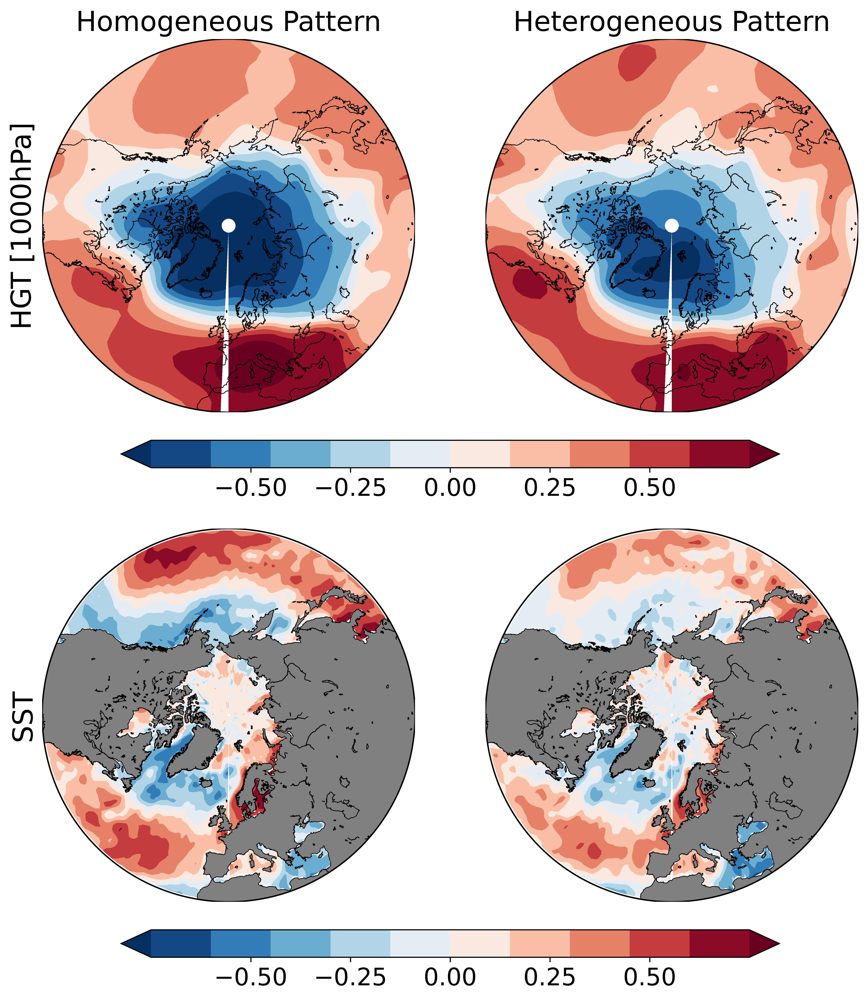

In [184]:
fig, axes = plt.subplots(2,2,figsize=(9,10),constrained_layout=True)

# for ind_PC in range(3):
hom_pattern = mca.homogeneous_patterns(n=1)
het_pattern = mca.heterogeneous_patterns(n=1)

vmin      = -7.5e-1 ; vmax  = 7.5e-1
levels    = 10    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

tmp_var =  hom_pattern['right'][:,:,0]       
m, x, y = basemap_base('npstere',axes[0][0],lat_ATM.sel(lat=slice(latN,latS)),
                                              lon_ATM.sel(lon=slice(lonL,lonR)),
                                              latS,'NOFILL')

contour_var = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')

tmp_var =  het_pattern['right'][:,:,0]       
m, x, y = basemap_base('npstere',axes[0][1],lat_ATM.sel(lat=slice(latN,latS)),
                                              lon_ATM.sel(lon=slice(lonL,lonR)),
                                              latS,'NOFILL')
contour_var = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')


vmin      = -7.5e-1 ; vmax  = 7.5e-1
levels    = 10    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

tmp_var =  hom_pattern['left'][:,:,0]       
m, x, y = basemap_base('npstere',axes[1][0],lat_OCN.sel(lat=slice(latN,latS)),
                                            lon_OCN.sel(lon=slice(lonL,lonR)),
                                            latS,'FILL')

contour_var = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')

tmp_var =  het_pattern['left'][:,:,0]       
m, x, y = basemap_base('npstere',axes[1][1],lat_OCN.sel(lat=slice(latN,latS)),
                                            lon_OCN.sel(lon=slice(lonL,lonR)),
                                            latS,'FILL')
contour_var = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')


axes[0][0].set_title("Homogeneous Pattern",fontsize=20)
axes[0][1].set_title("Heterogeneous Pattern",fontsize=20)
axes[1][0].set_ylabel(label_1,fontsize=20)
axes[0][0].set_ylabel(label_2,fontsize=20)

cb = fig.colorbar(contour_var,ax=axes[0][:], shrink=0.75,location='bottom')
cb.set_ticks([-0.5,-0.25,0,0.25,0.5])
cb.ax.tick_params(labelsize=17.5)

cb = fig.colorbar(contour_var,ax=axes[1][:], shrink=0.75,location='bottom')
cb.set_ticks([-0.5,-0.25,0,0.25,0.5])
cb.ax.tick_params(labelsize=17.5)